## Twitter Thread Analysis Done by Malcom Okonkwo


This project is aimed at analyzing a dataset containing tweets on the company Tesla. Inc. 

**To import all the needed libraries**

In [84]:
# importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import numpy as np
import re
import july
from textblob import TextBlob
from plotly_calplot import calplot
import warnings
from datetime import datetime
warnings.filterwarnings('ignore')

**To Import the dataset**

In [2]:
# Read the Excel file
tweet = pd.read_excel('Twitter_Thread_Analysis.xlsx')

# Print the data
print(tweet.head())

                        Date  \
0  2022-09-29 23:41:16+00:00   
1  2022-09-29 23:24:43+00:00   
2  2022-09-29 23:18:08+00:00   
3  2022-09-29 22:40:07+00:00   
4  2022-09-29 22:27:05+00:00   

                                               Tweet Stock Name Company Name  
0  Mainstream media has done an amazing job at br...       TSLA  Tesla, Inc.  
1  Tesla delivery estimates are at around 364k fr...       TSLA  Tesla, Inc.  
2  3/ Even if I include 63.0M unvested RSUs as of...       TSLA  Tesla, Inc.  
3  @RealDanODowd @WholeMarsBlog @Tesla Hahaha why...       TSLA  Tesla, Inc.  
4  @RealDanODowd @Tesla Stop trying to kill kids,...       TSLA  Tesla, Inc.  


.

## Data Cleaning & Data Preprocessing

In this step, I would be assessing the data visually and programmatically for data quality issues and issues with the structure of the data.

The first step to a data cleaning problem is to create a copy of the data

In [3]:
# creating a copy of the dataset
tweets = tweet.copy()

**To check the Shape of the data**

In [4]:
# to check the shape of the data
tweets.shape

(80793, 4)

There are 80,793 rows and 4 columns in the tweet dataset. 

.

**To check if there are duplicated tweets**


In [5]:
# check for duplicate rows
duplicates = tweets[tweets.duplicated()]

# print the duplicate rows
print(duplicates)

Empty DataFrame
Columns: [Date, Tweet, Stock Name, Company Name]
Index: []


In [6]:
# count the number of duplicate rows
num_duplicates = sum(tweets.duplicated())

# print the number of duplicate rows
print("Number of duplicate rows: ", num_duplicates)

Number of duplicate rows:  0


.

**To check for the presence of Null Values**

In [8]:
# count the number of null values in each column
null_counts = tweets.isnull().sum()

# print the null counts
print(null_counts)

Date            0
Tweet           0
Stock Name      0
Company Name    0
dtype: int64


.

**To check for datatypes**

In [9]:
# to check for the data types
tweets.dtypes

Date            object
Tweet           object
Stock Name      object
Company Name    object
dtype: object

The datatype of the [date] column is inconsistent. This would be converted to datetime datatype

In [10]:
# convert the 'date' column to datetime datatype
tweets['Date'] = pd.to_datetime(tweets['Date'])

# to check if the changes were made
tweets.dtypes

Date            datetime64[ns, UTC]
Tweet                        object
Stock Name                   object
Company Name                 object
dtype: object

This wraps up the data cleaning process

.

## Exploratory Data Analysis

In this section of the data, I would be analyzing the dataset to get insights from the data.



**First is to find the total number of tweets**

In [11]:
# to find the total number of tweets 
num_rows = len(tweets['Tweet'])

print("Number of Tweets in the dataset:", num_rows)

Number of Tweets in the dataset: 80793


**Next, I would like to find the number of tweets over time. First is to find the time frame of the tweet**

In [12]:
#to find the maximum date of the tweet
tweets["Date"].max()

Timestamp('2022-09-29 23:41:16+0000', tz='UTC')

In [13]:
#to find the minimum date of the tweet
tweets["Date"].min()

Timestamp('2021-09-30 00:06:02+0000', tz='UTC')

>**Therefore the data is containing tweets from the 30th September 2021 to 29th September 2022**

To show the number of tweets per month using a line chart

In [63]:
str(most_tweet)[14:18]

'1114'

The day with the highest number of tweets is 2022-02-03 with 1114 tweets


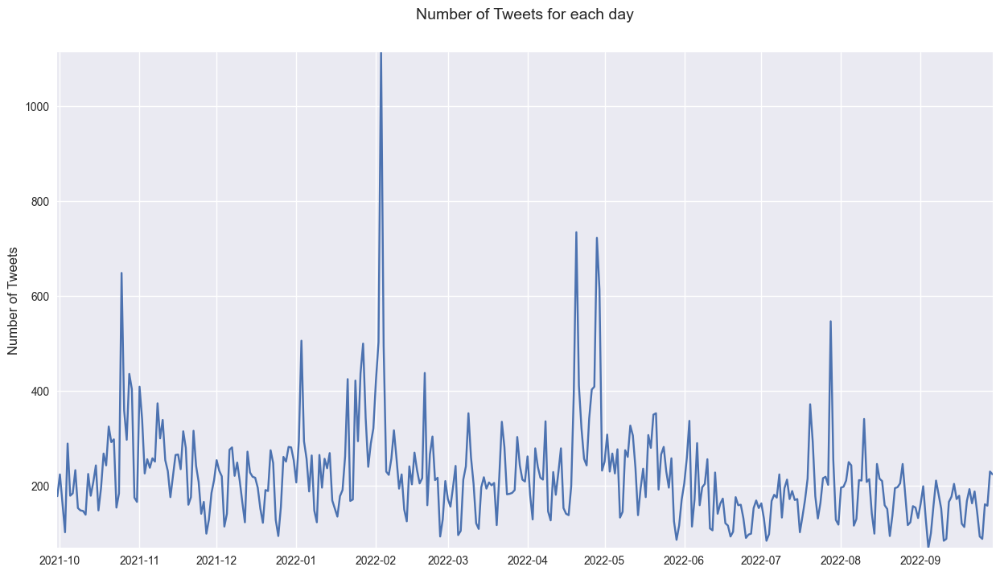

In [65]:
# to get the day with the highest number of tweets
grouped = tweets['date'].value_counts().sort_values(ascending = False)
most_tweet = grouped[:1]
tweet_day = str(most_tweet.index)[16:26]
tweet_count = str(most_tweet)[14:18]
print(f'The day with the highest number of tweets is {tweet_day} with {tweet_count} tweets')

# to plot a line chart for the nuber of tweets per day
grouped = grouped.sort_index()
plt.figure(figsize= [15, 8])
sns.lineplot(x = grouped.index, y = grouped)
plt.ylabel('Number of Tweets', fontsize = 12)
plt.title('Number of Tweets for each day', fontsize = 14)
plt.show()

> From the chart above, the day with the most tweets is the 3rd of February 2022. This day has 1114 tweets

To compare the number of tweets on a monthly basis

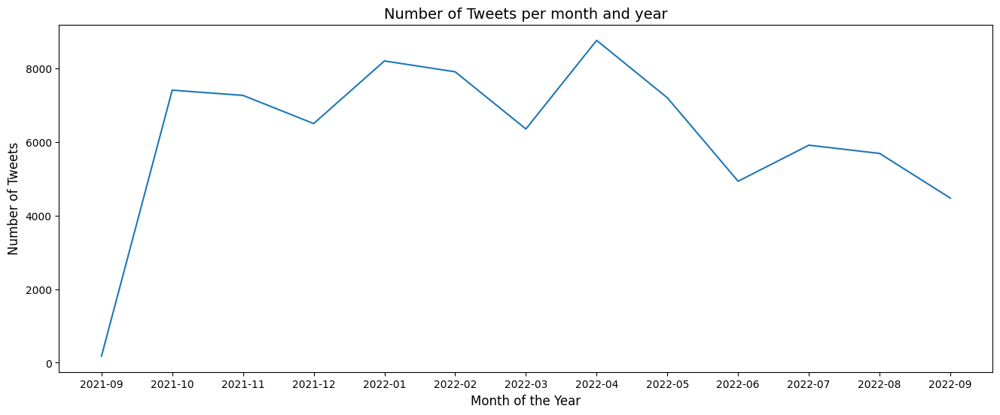

In [14]:
# Extract the month and year together
tweets['month_year'] = tweets['Date'].dt.strftime('%Y-%m')


grouped = tweets['month_year'].value_counts().sort_index()

plt.figure(figsize= [16, 6])
sns.lineplot(x = grouped.index, y = grouped)
plt.xlabel('Month of the Year', fontsize = 12)
plt.ylabel('Number of Tweets', fontsize = 12)
plt.title('Number of Tweets per month and year', fontsize = 14)
plt.show()

> From the Chart above, we can see that majority of the tweets came in the period of October 2021 to May 2022 where each of the months in this period had over 6000 tweets


I want to look into the hour of the day where most of the tweets were made

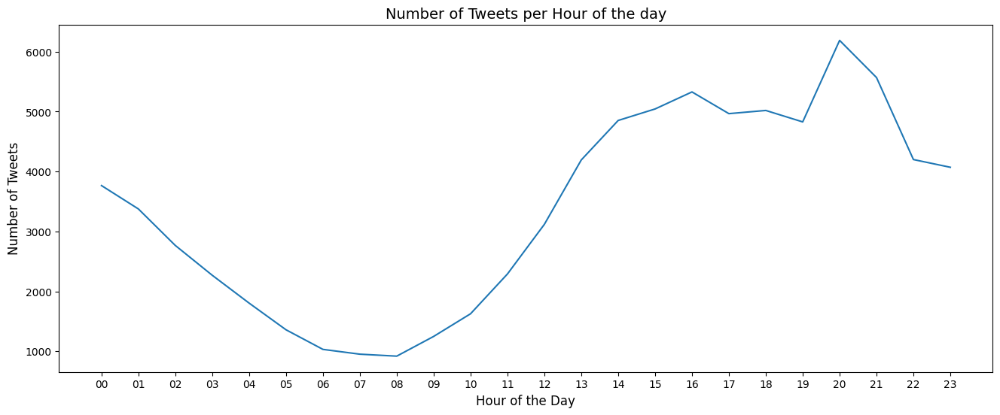

In [15]:
# Extract the month and year together
tweets['hour'] = tweets['Date'].dt.strftime('%H')


grouped = tweets['hour'].value_counts().sort_index()
plt.figure(figsize= [16, 6])
sns.lineplot(x = grouped.index, y = grouped)
plt.xlabel('Hour of the Day', fontsize = 12)
plt.ylabel('Number of Tweets', fontsize = 12)
plt.title('Number of Tweets per Hour of the day', fontsize = 14)
plt.show()

> This shows that most of the tweets were created during from 1pm to 12am. The highest amount of tweets are within 8pm and 9pm.

Next I want to show an interactive heatmap calendar to show the count of tweets for each day. Before I do that, I would like to extract the date from the date column which is a timestamp data type. I would first rename the current [Date] column to [Timestamp] then extract the date and save it in a [date] column

In [16]:
# Rename the date column in the dataframe
tweets = tweets.rename(columns={'Date': 'Timestamp'})

# Extract the date from the timestamp data
tweets['date'] = tweets['Timestamp'].dt.date

#to print out the output
tweets.head()

,Timestamp,Tweet,Stock Name,Company Name,month_year,hour,date
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29
3,2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",2022-09,22,2022-09-29


In [17]:
# convert the datatype of the date column to a date datatype
tweets['date'] = pd.to_datetime(tweets['date'])

# to check if it worked
tweets.dtypes

Timestamp       datetime64[ns, UTC]
Tweet                        object
Stock Name                   object
Company Name                 object
month_year                   object
hour                         object
date                 datetime64[ns]
dtype: object

The next step would be to count the number of tweets coming in each day then use it to create the calendar heatmap using calplot. Read up about its Documentation [Here](https://pypi.org/project/plotly-calplot/)

In [18]:
# to count the number of tweets per day
date = tweets.groupby('date')['Tweet'].count()
date = date.reset_index()

# to plot the calendar heatmap
plt.figure(figsize = (10, 8))
fig = calplot(date, x = "date", y = "Tweet", gap = 3, years_title = True, name = "Number of Tweets",\
              colorscale = "blues")
fig.show()


<Figure size 1000x800 with 0 Axes>

This could also be displayed in a different kind of calendar map using a python package called july. The documentation can be found [Here](https://pypi.org/project/july/)

array([[<Axes: title={'center': 'September'}>,
        <Axes: title={'center': 'October'}>,
        <Axes: title={'center': 'November'}>,
        <Axes: title={'center': 'December'}>],
       [<Axes: title={'center': 'January'}>,
        <Axes: title={'center': 'February'}>,
        <Axes: title={'center': 'March'}>,
        <Axes: title={'center': 'April'}>],
       [<Axes: title={'center': 'May'}>,
        <Axes: title={'center': 'June'}>,
        <Axes: title={'center': 'July'}>,
        <Axes: title={'center': 'August'}>],
       [<Axes: title={'center': 'September'}>, <Axes: >, <Axes: >,
        <Axes: >]], dtype=object)

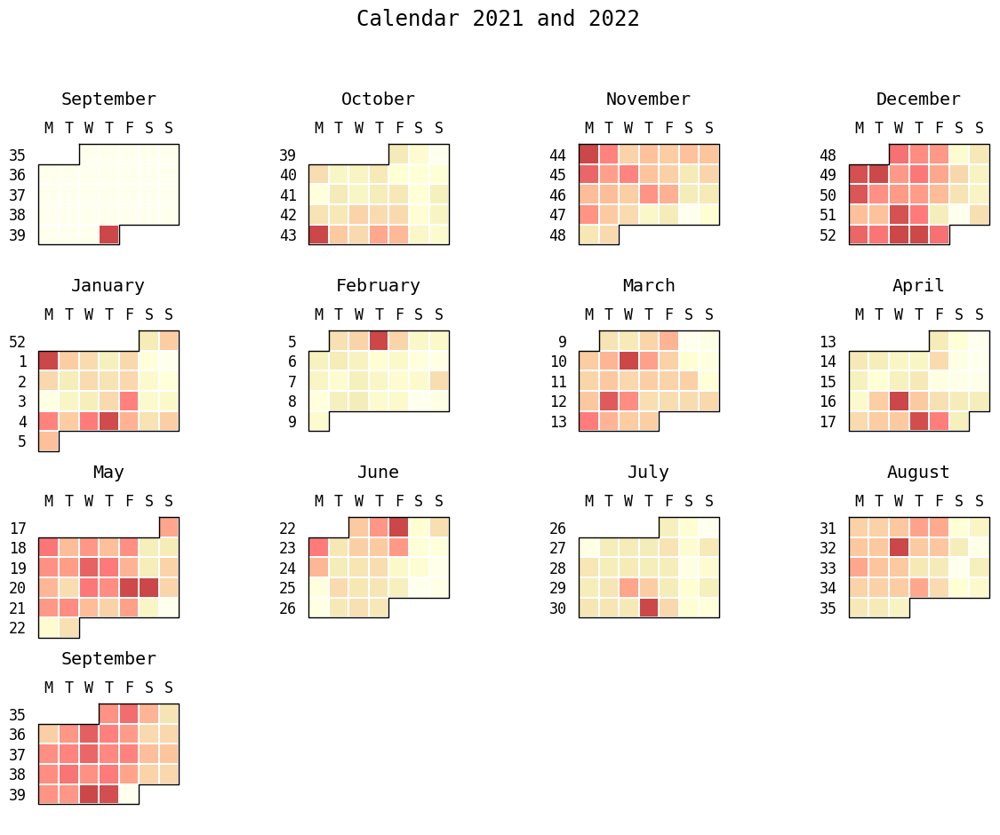

In [19]:
july.calendar_plot(date.date, date.Tweet)

This can also be represented in a github style

<Axes: title={'center': 'Tweets Activity'}>

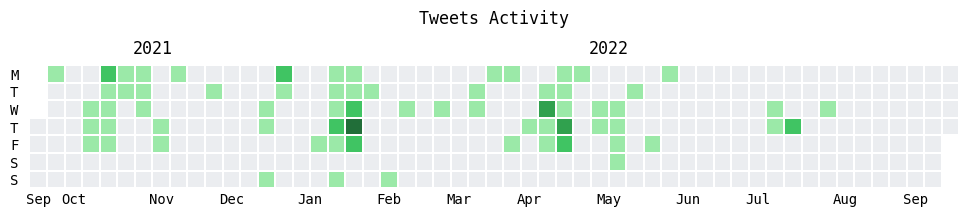

In [20]:
july.heatmap(date['date'], date['Tweet'], title = "Tweets Activity", cmap = "github", fontsize = 10) 

**To Show the most frequent Hashtags in the tweets**

I want to show the top most frequent hashtags in the tweets 

#fsdbeta        264
#btc            267
#stickynote     270
#stocks         274
#teslastock     285
#elonmusk       286
#options        296
#tsla           413
#bitcoin        550
#tesla         2874
Name: 0, dtype: int64


<Axes: title={'center': 'Top Tweeted Hashtags'}>

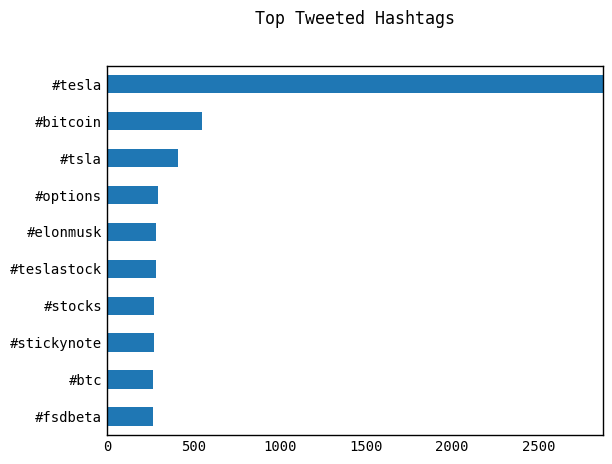

In [21]:
hashtags = tweets['Tweet'].str.extractall(r'(\#\w*)')[0].str.lower()\
            .value_counts()[:10].sort_values(ascending = True)
print(hashtags)
hashtags.plot(kind = 'barh', title = "Top Tweeted Hashtags")

> This shows that the most tweeted hashtag is #tesla, #bitcoin and #tsla.



**To FInd the account with the most mentions**

The next step is to show the accounts with the most mentions from the tweets scraped

@wholemarsblog      441
@tsm_albralelie     447
@tsm_leffen         465
@tsm_myth           546
@tsm_reps           616
@imperialhal        622
@unusual_whales     682
@tsm               3201
@elonmusk          6797
@tesla             7659
Name: 0, dtype: int64


<Axes: title={'center': 'Most Tagged Twitter Handle'}>

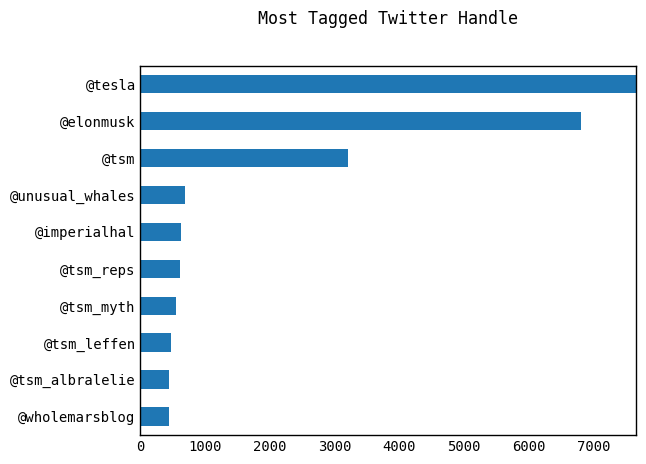

In [22]:
# to count the number of mentions in the tweets
mentions = tweets['Tweet'].str.extractall(r'(\@\w*)')[0].str.lower()\
            .value_counts()
            #lower function is used because there is @Tesla & @tesla in the output

# there is just @ in the output so this code removes it
mentions = mentions[mentions.index != '@']

#to get the top 10 most mentioned accounts
mentions = mentions[:10].sort_values(ascending = True)
print(mentions)

# to plot 
mentions.plot(kind = 'barh', title = "Most Tagged Twitter Handle")

> From the chart above, the most mentioned twitter accounts are **@tesla, @elonmusk & @tsm**

### Sentiment Analysis

Sentiment Analysis is the process of analyzing the digital text to determine if the emotional tone of the message is Positive, Negative or Neutral. You can read more about sentiment analysis [Here](https://aws.amazon.com/what-is/sentiment-analysis/)

The sentiment function of textblob returns two properties, **Polarity**, and **Subjectivity**.

**Polarity** is float which lies in the range of [-1,1] where 1 means positive statement and -1 means a negative statement and 0 is a neutral statement. 

**Subjective** sentences generally refer to personal opinion, emotion or judgment whereas objective refers to factual information. Subjectivity is also a float which lies in the range of [0,1].


Before proceeding to perform sentiment analysis, I would first clean the tweets by removing @ mentions, # symbol, removing hyperlinks and also removing RT if exists in the tweets

In [24]:
# clean the text

# create a function to clean the tweets
def cleanTxt(text):
    text = re.sub(r'@[A-Za-z0-9]*', '', text) #removes @mentions
    text = re.sub(r'#', '', text) #removing the # symbol
    text = re.sub(r'RT[/s]+', '', text) #removing RT if exists
    text = re.sub(r'https?:\/\/\S+', '', text) #remvoes hyperlink
    text = text.strip() #removing extra spaces
    return text

# cleaning the tweets
tweets['Tweet'] = tweets['Tweet'].apply(cleanTxt)

#show the cleaned tweets
tweets['Tweet']

0        Mainstream media has done an amazing job at br...
1        Tesla delivery estimates are at around 364k fr...
2        3/ Even if I include 63.0M unvested RSUs as of...
3        Hahaha why are you still trying to stop Tesla ...
4        Stop trying to kill kids, you sad deranged old...
                               ...                        
80788    Some of the fastest growing tech stocks on the...
80789    With earnings on the horizon, here is a quick ...
80790    Our record delivery results are a testimony of...
80791    We delivered 10,412 Smart EVs in Sep 2021, rea...
80792    Why can XPeng P5 deliver outstanding performan...
Name: Tweet, Length: 80793, dtype: object

Next step is to get the subjectivity and polarity of each tweet

In [27]:
# Creating function to get the subjectivity of the tweet
def getSubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

#creating function to get the polarity of the tweet
def getPolarity(text):
    return TextBlob(text).sentiment.polarity

# creating the subjectivity and polarity column
tweets['Subjectivity'] = tweets['Tweet'].apply(getSubjectivity)
tweets['Polarity'] = tweets['Tweet'].apply(getPolarity)

#show the new dataframe
tweets.head(10)

,Timestamp,Tweet,Stock Name,Company Name,month_year,hour,date,Subjectivity,Polarity
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29,0.900000,0.600000
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29,0.000000,0.000000
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29,0.277273,0.018182
3,2022-09-29 22:40:07+00:00,Hahaha why are you still trying to stop Tesla ...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.433333,0.079167
4,2022-09-29 22:27:05+00:00,"Stop trying to kill kids, you sad deranged old...",TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.600000,-0.200000
5,2022-09-29 22:25:53+00:00,This is you,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.000000,0.000000
6,2022-09-29 22:24:22+00:00,For years viciously silenced critics. Failin...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.837500,-0.375000
7,2022-09-29 22:23:54+00:00,$NIO just because I'm down money doesn't mean ...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.490234,0.051962
8,2022-09-29 22:23:28+00:00,50 likes for some $SPY $TSLA charts to study!\...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.000000,0.000000
9,2022-09-29 22:15:01+00:00,__321 The powerwalls themselves are waterp...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.666667,-0.700000


Next step is to analyze if the tweet is Positive, Negative or Neutral. This would be done using the [Polarity] column. 
- Negative = [Polarity] < 0
- Neutral = [Polarity] = 0
- Positive = [Polarity] > 0

In [28]:
# create a function to compute the neutral, negative and positive analysis
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'
    
#apply the function
tweets['Analysis'] = tweets['Polarity'].apply(getAnalysis)

#show the dataframe
tweets.head(10)

,Timestamp,Tweet,Stock Name,Company Name,month_year,hour,date,Subjectivity,Polarity,Analysis
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29,0.900000,0.600000,Positive
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29,0.000000,0.000000,Neutral
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",2022-09,23,2022-09-29,0.277273,0.018182,Positive
3,2022-09-29 22:40:07+00:00,Hahaha why are you still trying to stop Tesla ...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.433333,0.079167,Positive
4,2022-09-29 22:27:05+00:00,"Stop trying to kill kids, you sad deranged old...",TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.600000,-0.200000,Negative
5,2022-09-29 22:25:53+00:00,This is you,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.000000,0.000000,Neutral
6,2022-09-29 22:24:22+00:00,For years viciously silenced critics. Failin...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.837500,-0.375000,Negative
7,2022-09-29 22:23:54+00:00,$NIO just because I'm down money doesn't mean ...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.490234,0.051962,Positive
8,2022-09-29 22:23:28+00:00,50 likes for some $SPY $TSLA charts to study!\...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.000000,0.000000,Neutral
9,2022-09-29 22:15:01+00:00,__321 The powerwalls themselves are waterp...,TSLA,"Tesla, Inc.",2022-09,22,2022-09-29,0.666667,-0.700000,Negative


To show the percentage of Positive, Neutral and Negative tweets

Positive    39432
Neutral     27175
Negative    14186
Name: Analysis, dtype: int64


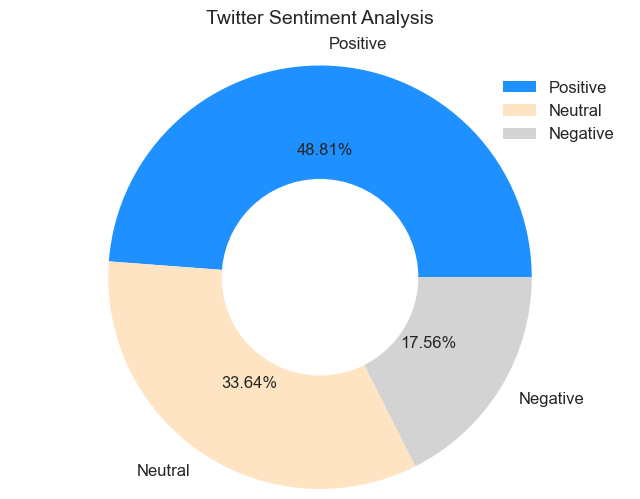

In [30]:
# to count the number of present and absent 
show = tweets['Analysis'].value_counts()
print(show)

#to represent it in a pie plot
plt.style.use('seaborn')
plt.pie(show, labels = show.index, radius = 1.4, autopct = '%0.2f%%', colors = ['dodgerblue', 'bisque', 'lightgrey'], 
        textprops = {'fontsize' : 12})
plt.axis('equal')
plt.title('Twitter Sentiment Analysis', fontsize = 14 )
plt.legend(loc = 'upper right', fontsize = 12)

circle = plt.Circle(xy=(0,0), radius = 0.65, facecolor = 'white')
plt.gca().add_artist(circle)
plt.show()

> From the sentiment analysis, 48.81%(39432) of the tweets are Positive while 33.64%(27175) are Neutral and the remaining are negative tweets

Next, I check out the positive and negative tweets ranked in terms of tweets with the highest Polarity [most positive] and lowest polarity [most negative]

In [32]:
# to print the most positive tweet
j =1
sortedDF = tweets.sort_values(by = ['Polarity'])
for i in range(0, sortedDF.shape[0]):
    if (sortedDF['Analysis'][i] == 'Positive'):
        print(str(j) + ') ' + sortedDF['Tweet'][i])
        print()
        j = j + 1

1) Mainstream media has done an amazing job at brainwashing people. Today at work, we were asked what companies we believe in &amp; I said  because they make the safest cars &amp; EVERYONE disagreed with me because they heard“they catch on fire &amp; the batteries cost 20k to replace”

2) 3/ Even if I include 63.0M unvested RSUs as of 6/30, additional equity needed for the RSUs is 63.0M x $54.20 = $3.4B. If the deal closed tomorrow at $54.20, Elon would need $2.0B for existing shares plus $3.4B for RSUs, so $5.4B new equity. $twtr $tsla

3) Hahaha why are you still trying to stop Tesla FSD bro! Get your shit together and make something better? Thats how companies work, they competed. Crying big old ass fart clown!

4) $NIO just because I'm down money doesn't mean this is a bad investment. The whole market, everything sucks right now. 2-5 years from now, I'm confident it will pay off. Long the best $AAPL $AMZN $TSLA $GOOGL $NIO

5) Tomorrow, Tesla, $TSLA, AI day 2 is ongoing.

Unusual W

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [33]:
# to print the most negative tweet
j =1
sortedDF = tweets.sort_values(by = ['Polarity'], ascending = False)
for i in range(0, sortedDF.shape[0]):
    if (sortedDF['Analysis'][i] == 'Negative'):
        print(str(j) + ') ' + sortedDF['Tweet'][i])
        print()
        j = j + 1

1) Stop trying to kill kids, you sad deranged old man

2) For years  viciously silenced  critics. Failing to silence me, he desperately lashes out  with childish insults about me, my company, my products - and even my 💩! His fear and impotence spurs me on to ensure that everyone understands Full Self-Driving is💩.

3) __321     The powerwalls themselves are waterproof, but what could be bad is any wiring in the house that could be damaged.

4) $TSLAQ: Tesla’s dead in Europe! Everyone else is passing $TSLA in the EU now in EV unit sales! If you don’t believe us, go to eu-evs and see for yourself!

Me: &lt;goes to eu-evs&gt; 🧐

5) The irony is so thick you can cut it with a knife.

6) Even after being down 7% today the PE is 103x. Totally insane with growth having plateaued and a 10% haircut to ASP from FX. Nobody should be surprised when $TSLAQ is a fraction of itself in 6 months! $TSLA $TSLAQ

7) Tesla $TSLA Shares Could Rise in Coming Weeks Due to 3 Factors, Says Goldman Sachs

8) This

8871) $AAPL - Above 160 - Swing Trade Idea 💡 -  Dec 23 165C

Closed at 160.55

If AAPL can continue to base above 157 it can test 164, 167 next

Puts can work under 153
-
$AAPL $AMD $AMZN $BA $BYND $FB $LCID $MSFT $NFLX $NIO $NVDA $PLTR $ROKU $RVNA $SNAP $SPX $SPY $SQ $TSLA $ZM

8872) Two stocks that I think will dominate in the metaverse and NFTs

$FB
$COIN

You can hate Zuck all you want but he has been heavily working on virtual reality since 2014

8873) $TSLA - Above 1021 - Trade Idea 💡 -  Nov 19 1100C

Closed at 1033.42

If TSLA can consolidate for 2-3 days above 1021 it will setup for 1100-1128 by Thanksgiving

Puts can work under 988
-
$AAPL $AMD $AMZN $BA $FB $LCID $MSFT $NFLX $NIO $NVDA $PLTR $ROKU $SNAP $SPCE $SPX $SPY

8874) $NVDA - Earnings Trade Idea 💡 -  Nov 19 320C

Closed at 303.90

If NVDA closes through 323 after ER it can run to 344-350 next

Earnings: Wednesday After Hours (20-22 pt mv priced in)
-
$AAPL $AMD $AMZN $BA $FB $LCID $MSFT $NFLX $NIO $NVDA $PLTR $ROKU $S

To observe the time which the Positive, Negative and Neutral Tweets were made

<Figure size 1600x800 with 0 Axes>

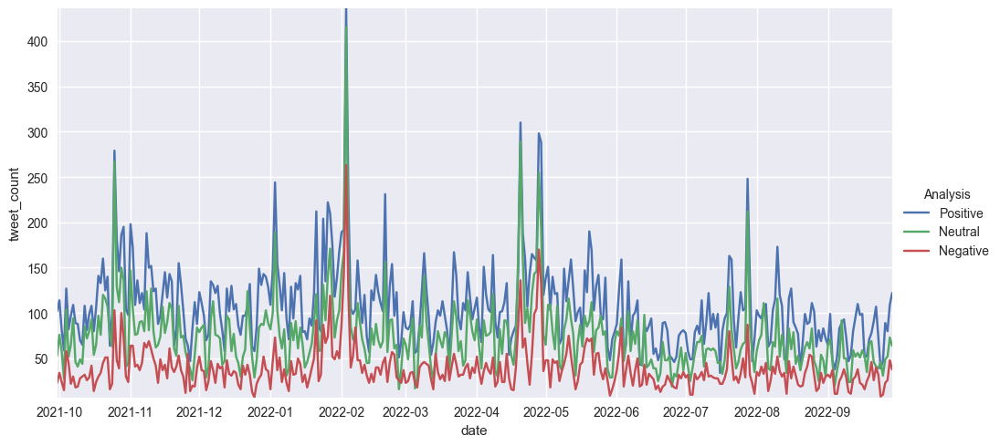

In [80]:
# to create a line plot
grouped = tweets[['date','Analysis']].value_counts()
grouped = grouped.reset_index(name = 'tweet_count')

# plotting the chart
plt.figure(figsize = [16, 8])
#to plot a line chart
sns.relplot(x = "date", y = "tweet_count", data = grouped, kind = "line", \
            height = 5, aspect = 2, ci = None, hue = 'Analysis')

To make it more visible by counting the tweets per month 

<Figure size 1600x800 with 0 Axes>

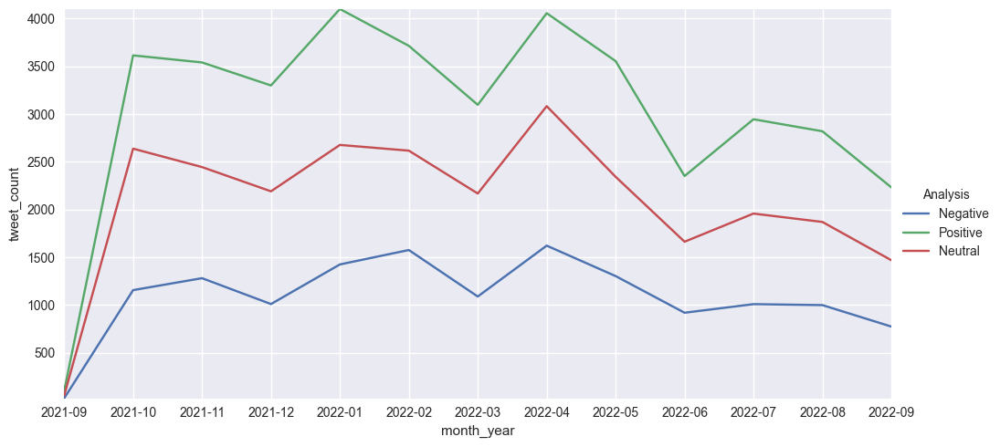

In [83]:
# to create a line plot
grouped = tweets[['month_year','Analysis']].value_counts()
grouped = grouped.reset_index(name = 'tweet_count').sort_values('month_year')

# plotting the chart
plt.figure(figsize = [16, 8])
#to plot a line chart
sns.relplot(x = "month_year", y = "tweet_count", data = grouped, kind = "line", \
            height = 5, aspect = 2, ci = None, hue = 'Analysis')

.

### Creating a Word Cloud

FInally a word cloud would be created to show the most common keywords. I would be using [WordArt](https://wordart.com/) to create my word cloud. Then I would load it into python using Matplotlib.

PS: There is a WordCloud library that is used to create word clouds. I could not install the library but you can read up on how to use the library [Here](https://www.datacamp.com/tutorial/wordcloud-python)

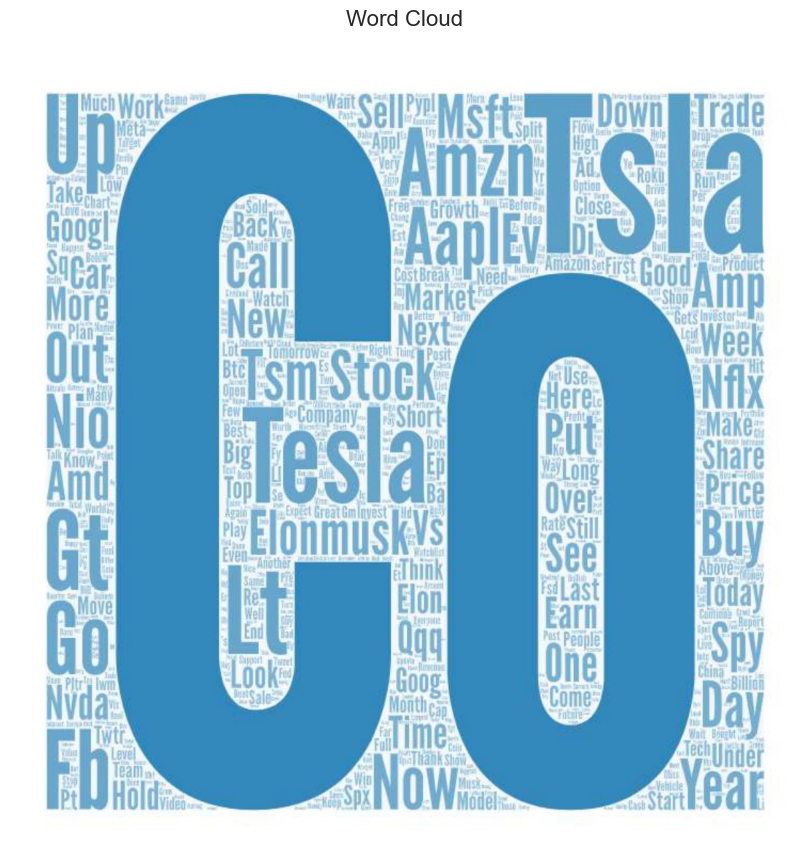

In [92]:
# to import the word cloud image 
plt.figure(figsize = (13,10))
plt.title('Word Cloud', fontsize = 16)
image = mpimg.imread('word_cloud_page-0001.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()

This shows that the most common word is "CO". I could not really interpret what CO meant but I then created another word cloud excluding CO

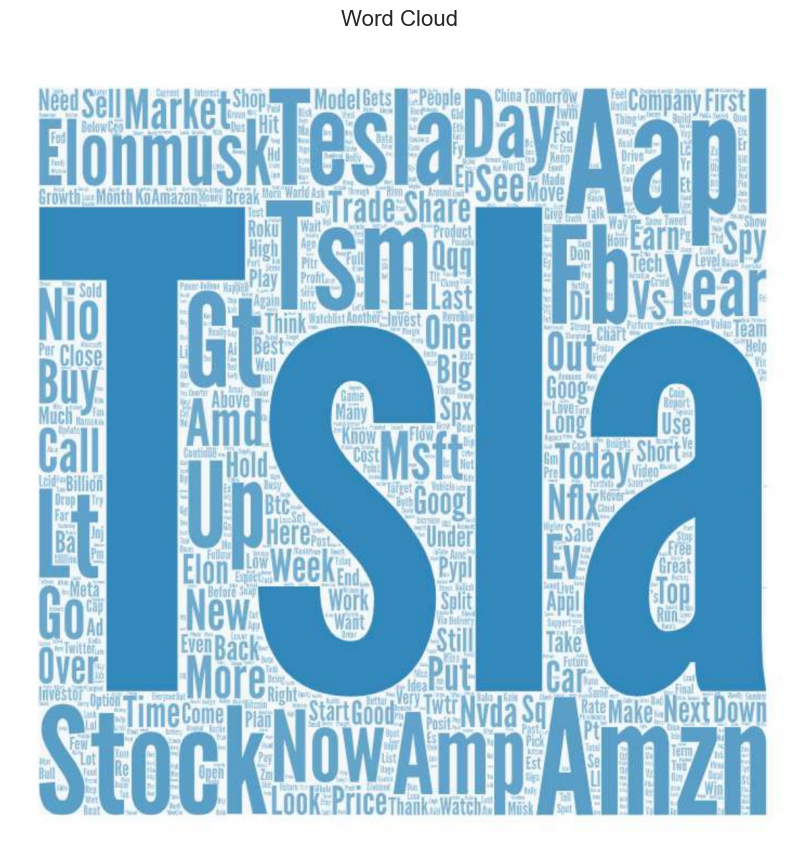

In [93]:
# to import the word cloud image 
plt.figure(figsize = (13,10))
plt.title('Word Cloud', fontsize = 16)
image = mpimg.imread('word_cloud2_page-0001.jpg')
plt.imshow(image)
plt.axis('off')
plt.show()